## Experiments:
On public known synthetic datasets (e.g. Madelon):

    * Comparing the Performance of FNN, GINI, STG, Dual-STG, GINI+Dual-STG 
    * Comparing the how many iteration each model need to converge 
    * Estimate the Computation and Communication Overhead

On real datasets (e.g. BASEHOCK):

    * Comparing the robustness of each model against number of noisy features added
    * Comparing the convergence speed
    * Also, Estimate the Computation and Communication Overhead

Desired Results:
    STG, Dual-STG is more robust against noise
    Comparing with STG, Dual-STG + GINI reduce the overhead by reducing the total number of rounds for the model to reach convergence (e.g. earlystop); reducing the size of transimitted message (smaller embedding); 
    It would be better if we also notice that Dual-STG + GINI can detect noisy features more precisely.


To use this Code: Read __Data.py__ and __VFL.py__ for the parameters

Example 1: FNN on BASEHOCK (no Feature selection, no noise, no Gini)

In [6]:
from Data import VFLDataset
import VFL
from torch.utils.data import DataLoader
dataset = VFLDataset('BASEHOCK', scale=True, num_clients=3,
    gini_portion=None, insert_noise=False)
# Instead of passing the name of the dataset, VFLDataset also accepts a tuple of
# numpy array (X, y)
train_loader = DataLoader(dataset.train(), batch_size=128, shuffle=True)
val_loader = DataLoader(dataset.valid(), batch_size=1000, shuffle=True)
test_loader = DataLoader(dataset.test(), batch_size=1000, shuffle=True)
input_dim_list = dataset.get_input_dim_list()
models, top_model = VFL.make_binary_models(
    input_dim_list, type='FNN'
)
# Read VFL for more details
# Pay extra attention to the saving dir of the model
no_fs_history = VFL.train(models, top_model, train_loader, val_loader, test_loader, 
    epochs=100)

Trying to load the datasets from BASEHOCK
(1993, 4862) (1993,)
Client 0: Feature Index 0-1215
Client 1: Feature Index 1216-2431
Client 2: Feature Index 2432-3646
Server : Feature Index 3647-4861
Epoch: 1, Train Loss: 2.7590, Train Acc: 0.5523, Val Acc 0.5414, Test Acc: 0.5414, Best Acc: 0.5414
Epoch: 2, Train Loss: 2.6961, Train Acc: 0.5729, Val Acc 0.6667, Test Acc: 0.6667, Best Acc: 0.6667
Epoch: 3, Train Loss: 2.5053, Train Acc: 0.8232, Val Acc 0.9749, Test Acc: 0.9749, Best Acc: 0.9749
Epoch: 4, Train Loss: 1.9118, Train Acc: 0.9902, Val Acc 0.9925, Test Acc: 0.9925, Best Acc: 0.9925
Epoch: 5, Train Loss: 0.9961, Train Acc: 0.9941, Val Acc 0.9975, Test Acc: 0.9975, Best Acc: 0.9975
Epoch: 6, Train Loss: 0.3018, Train Acc: 0.9980, Val Acc 0.9950, Test Acc: 0.9950, Best Acc: 0.9975
Epoch: 7, Train Loss: 0.0680, Train Acc: 0.9961, Val Acc 1.0000, Test Acc: 1.0000, Best Acc: 1.0000
Epoch: 8, Train Loss: 0.0128, Train Acc: 1.0000, Val Acc 1.0000, Test Acc: 1.0000, Best Acc: 1.0000
Epoch

Example 2: Dual-STG on BASEHOCK with Noise

Trying to load the datasets from BASEHOCK
(1993, 4862) (1993,)
Inserting : 10 Random Samples, 5 Overwhelmed Samples, 5 Shortcut Samples
Client 0: Feature Index 0-1222
Client 1: Feature Index 1223-2445
Client 2: Feature Index 2446-3668
Server : Feature Index 3669-4891
Random: 0.0020, Over: 0.0010, Short: 0.0010, Total 0.004088
Epoch: 1, Train Loss: 3.2770, Train Acc: 0.5180, Val Acc 0.7995, Test Acc: 0.8296, Best Acc: 0.7994987468671679, Num Feats: 4892.0000, Num Emb: 512.0000
Random: 0.0020, Over: 0.0010, Short: 0.0010, Total 0.004088
Epoch: 2, Train Loss: 1.8202, Train Acc: 0.8857, Val Acc 0.9599, Test Acc: 0.9649, Best Acc: 0.9598997493734336, Num Feats: 4892.0000, Num Emb: 512.0000
Random: 0.0020, Over: 0.0010, Short: 0.0010, Total 0.004088
Epoch: 3, Train Loss: 1.0936, Train Acc: 0.9482, Val Acc 0.8697, Test Acc: 0.8922, Best Acc: 0.9598997493734336, Num Feats: 4892.0000, Num Emb: 512.0000
Random: 0.0020, Over: 0.0010, Short: 0.0010, Total 0.004088
Epoch: 4, Train Loss: 3.1007, Tra

,train_loss,train_acc,val_acc,test_acc,num_feats,num_emb,random_acc,over_acc,short_acc,total_acc
0,3.277049,0.517969,0.799499,0.829574,4892,512,0.002044,0.001022,0.001022,0.004088
1,1.820200,0.885677,0.959900,0.964912,4892,512,0.002044,0.001022,0.001022,0.004088
2,1.093619,0.948177,0.869674,0.892231,4892,512,0.002044,0.001022,0.001022,0.004088
3,3.100677,0.916927,0.972431,0.984962,4892,512,0.002044,0.001022,0.001022,0.004088
4,0.999134,0.970703,1.000000,0.987469,4892,512,0.002044,0.001022,0.001022,0.004088
...,...,...,...,...,...,...,...,...,...,...
95,0.283842,0.998047,0.994987,0.994987,1326,143,0.728536,0.728741,0.728332,0.727719
96,0.247135,0.998047,0.997494,1.000000,1324,140,0.728945,0.729150,0.728741,0.728128
97,0.239648,1.000000,0.994987,1.000000,1319,136,0.729967,0.730172,0.729763,0.729150
98,0.249762,1.000000,0.994987,1.000000,1315,136,0.730785,0.730989,0.730581,0.729967


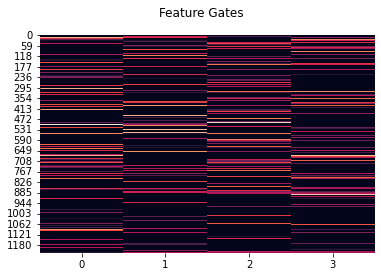

In [5]:
dataset = VFLDataset('BASEHOCK', scale=True, num_clients=3,
    gini_portion=None, insert_noise=True, num_random_samples=10, 
    num_overwhelemd=5, num_shortcut=5)
train_loader = DataLoader(dataset.train(), batch_size=128, shuffle=True)
val_loader = DataLoader(dataset.valid(), batch_size=1000, shuffle=True)
test_loader = DataLoader(dataset.test(), batch_size=1000, shuffle=True)
input_dim_list = dataset.get_input_dim_list()
models, top_model = VFL.make_binary_models(
    input_dim_list, type='DualSTG', emb_dim=128, output_dim=1, hidden_dims=[512, 256],
    sigma=1.0, lam=0.1, top_sigma=1.0, top_lam=0.1)
noisy_label = dataset.get_inserted_features_label()
dual_stg_history = VFL.train(models, top_model, train_loader, val_loader, test_loader, 
    lr=1e-2, optimizer='Adam',
    epochs=100, noise_label=noisy_label)

Example 3: STG + GINI-0.5

Trying to load the datasets from BASEHOCK
(1993, 4862) (1993,)
Inserting : 10 Random Samples, 5 Overwhelmed Samples, 5 Shortcut Samples
Client 0: Feature Index 0-1222
Client 1: Feature Index 1223-2445
Client 2: Feature Index 2446-3668
Server : Feature Index 3669-4891
[0. 1. 1. ... 0. 1. 0.]
Random: 0.3217, Over: 0.3207, Short: 0.3207, Total 0.323794
Epoch: 1, Train Loss: 3.0404, Train Acc: 0.5229, Val Acc 0.5388, Test Acc: 0.5388, Best Acc: 0.5388471177944862, Num Feats: 3329.0000
Random: 0.3876, Over: 0.3865, Short: 0.3865, Total 0.389616
Epoch: 2, Train Loss: 2.9953, Train Acc: 0.5671, Val Acc 0.5414, Test Acc: 0.5414, Best Acc: 0.5413533834586466, Num Feats: 3006.0000
Random: 0.4413, Over: 0.4403, Short: 0.4403, Total 0.443377
Epoch: 3, Train Loss: 2.9758, Train Acc: 0.4954, Val Acc 0.5990, Test Acc: 0.5815, Best Acc: 0.5989974937343359, Num Feats: 2744.0000
Random: 0.4622, Over: 0.4612, Short: 0.4612, Total 0.464227
Epoch: 4, Train Loss: 2.7747, Train Acc: 0.6706, Val Acc 0.9123, T

,train_loss,train_acc,val_acc,test_acc,num_feats,random_acc,over_acc,short_acc,total_acc
0,3.040434,0.522917,0.538847,0.538847,3329,0.321750,0.320728,0.320728,0.323794
1,2.995252,0.567057,0.541353,0.541353,3006,0.387572,0.386549,0.386549,0.389616
2,2.975802,0.495443,0.598997,0.581454,2744,0.441333,0.440311,0.440311,0.443377
3,2.774691,0.670573,0.912281,0.907268,2641,0.462183,0.461161,0.461161,0.464227
4,2.298811,0.949219,0.912281,0.894737,2575,0.475675,0.474652,0.474652,0.477719
...,...,...,...,...,...,...,...,...,...
95,0.238113,1.000000,1.000000,1.000000,2525,0.485895,0.484873,0.484873,0.487939
96,0.240008,1.000000,1.000000,1.000000,2524,0.486304,0.485282,0.485282,0.488348
97,0.236647,1.000000,1.000000,1.000000,2523,0.486304,0.485282,0.485282,0.488348
98,0.237436,1.000000,1.000000,1.000000,2522,0.486509,0.485487,0.485487,0.488553


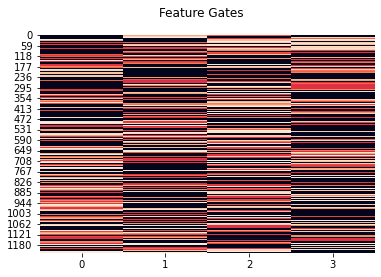

In [3]:
dataset = VFLDataset('BASEHOCK', scale=True, num_clients=3,
    gini_portion=0.5, insert_noise=True, num_random_samples=10, 
    num_overwhelemd=5, num_shortcut=5)
gini_labels = dataset.gini_filter()
feat_idx_list = dataset.get_feature_index_list()
# How we get gini labels 
mus = VFL.initialize_mu(gini_labels, feat_idx_list)
# AND USE THEM TO INITIALIZE MU
# MUCH SMARTER THEN PREVIOUS ONE
train_loader = DataLoader(dataset.train(), batch_size=128, shuffle=True)
val_loader = DataLoader(dataset.valid(), batch_size=1000, shuffle=True)
test_loader = DataLoader(dataset.test(), batch_size=1000, shuffle=True)
input_dim_list = dataset.get_input_dim_list()
models, top_model = VFL.make_binary_models(
    input_dim_list, type='STG', emb_dim=128, output_dim=1, hidden_dims=[512, 256],
    sigma=1.0, lam=0.1, top_sigma=1.0, top_lam=0.1, mus=mus)
noisy_label = dataset.get_inserted_features_label()
VFL.train(models, top_model, train_loader, val_loader, test_loader, 
    epochs=100, noise_label=noisy_label)